In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('./DataSet/credit card.csv')
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [3]:
df.shape

(30000, 25)

In [4]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [5]:
df.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default.payment.next.month        2
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [7]:
df = df.rename(columns={'default.payment.next.month':'payment'})

In [8]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [9]:
x=df.drop(['ID','payment'],axis=1)

In [10]:
y=df['payment']

In [11]:
y.value_counts()

0    23364
1     6636
Name: payment, dtype: int64

In [12]:
(23364/(23364+6636))*100

77.88000000000001

## Extra Trees Classifier

In [13]:
from sklearn.ensemble import ExtraTreesClassifier #Decision tree

In [14]:
extr = ExtraTreesClassifier()

In [15]:
extr.fit(x,y)

ExtraTreesClassifier()

In [16]:
extr.feature_importances_ #IG decision tree

array([0.06562993, 0.01091834, 0.03212101, 0.02283225, 0.06677441,
       0.10070678, 0.04655634, 0.03491579, 0.02765767, 0.03002493,
       0.02875745, 0.05039564, 0.04699423, 0.04512058, 0.04471543,
       0.04353288, 0.04415124, 0.04408426, 0.04240806, 0.04160598,
       0.04124414, 0.04277963, 0.04607306])

In [17]:
feature_importance = extr.feature_importances_
feature_importance  #info gain

array([0.06562993, 0.01091834, 0.03212101, 0.02283225, 0.06677441,
       0.10070678, 0.04655634, 0.03491579, 0.02765767, 0.03002493,
       0.02875745, 0.05039564, 0.04699423, 0.04512058, 0.04471543,
       0.04353288, 0.04415124, 0.04408426, 0.04240806, 0.04160598,
       0.04124414, 0.04277963, 0.04607306])

In [18]:
imp = pd.DataFrame(feature_importance , columns=['Gain_Score'])
imp

,Gain_Score
0,0.065630
1,0.010918
2,0.032121
3,0.022832
4,0.066774
5,0.100707
6,0.046556
7,0.034916
8,0.027658
9,0.030025


In [19]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [20]:
cols = pd.DataFrame(x.columns,columns=['Feature_Names'])
cols

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [21]:
gains = pd.concat([cols,imp],axis=1)
gains

,Feature_Names,Gain_Score
0,LIMIT_BAL,0.065630
1,SEX,0.010918
2,EDUCATION,0.032121
3,MARRIAGE,0.022832
4,AGE,0.066774
5,PAY_0,0.100707
6,PAY_2,0.046556
7,PAY_3,0.034916
8,PAY_4,0.027658
9,PAY_5,0.030025


In [22]:
gains.nlargest(15,'Gain_Score')

,Feature_Names,Gain_Score
5,PAY_0,0.100707
4,AGE,0.066774
0,LIMIT_BAL,0.065630
11,BILL_AMT1,0.050396
12,BILL_AMT2,0.046994
6,PAY_2,0.046556
22,PAY_AMT6,0.046073
13,BILL_AMT3,0.045121
14,BILL_AMT4,0.044715
16,BILL_AMT6,0.044151


In [23]:
gains.nsmallest(8,'Gain_Score')

,Feature_Names,Gain_Score
1,SEX,0.010918
3,MARRIAGE,0.022832
8,PAY_4,0.027658
10,PAY_6,0.028757
9,PAY_5,0.030025
2,EDUCATION,0.032121
7,PAY_3,0.034916
20,PAY_AMT4,0.041244


In [24]:
newx = gains.nlargest(18,'Gain_Score')
newx

,Feature_Names,Gain_Score
5,PAY_0,0.100707
4,AGE,0.066774
0,LIMIT_BAL,0.065630
11,BILL_AMT1,0.050396
12,BILL_AMT2,0.046994
6,PAY_2,0.046556
22,PAY_AMT6,0.046073
13,BILL_AMT3,0.045121
14,BILL_AMT4,0.044715
16,BILL_AMT6,0.044151


<AxesSubplot:>

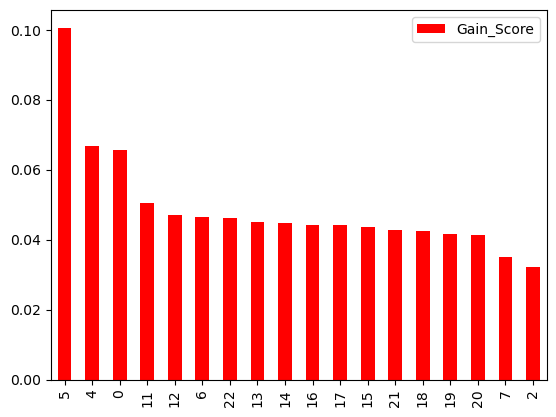

In [25]:
newx.plot(kind='bar',color=['red']) #barh mean horizontal

<AxesSubplot:>

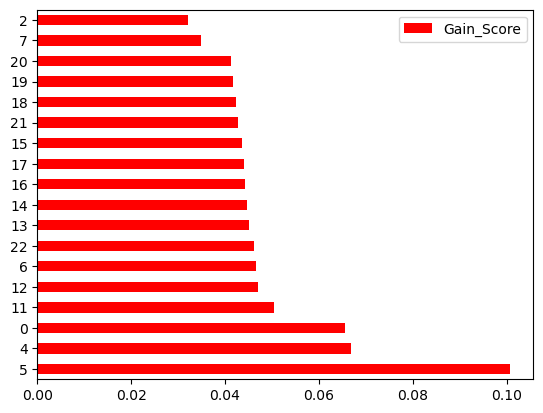

In [26]:
newx.plot(kind='barh',color=['red']) #barh mean horizontal

In [27]:
x.shape

(30000, 23)

In [28]:
import matplotlib.pyplot as plt

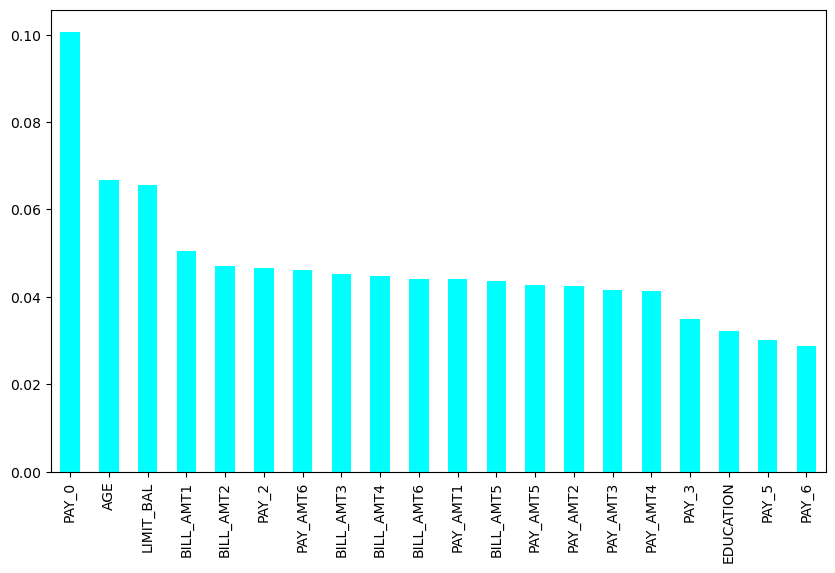

In [29]:
feature = pd.Series(extr.feature_importances_,index=x.columns)
plt.figure(figsize=(10,6))
feature.nlargest(20).plot(kind='bar',color='cyan')
plt.savefig('./image/score1.png')

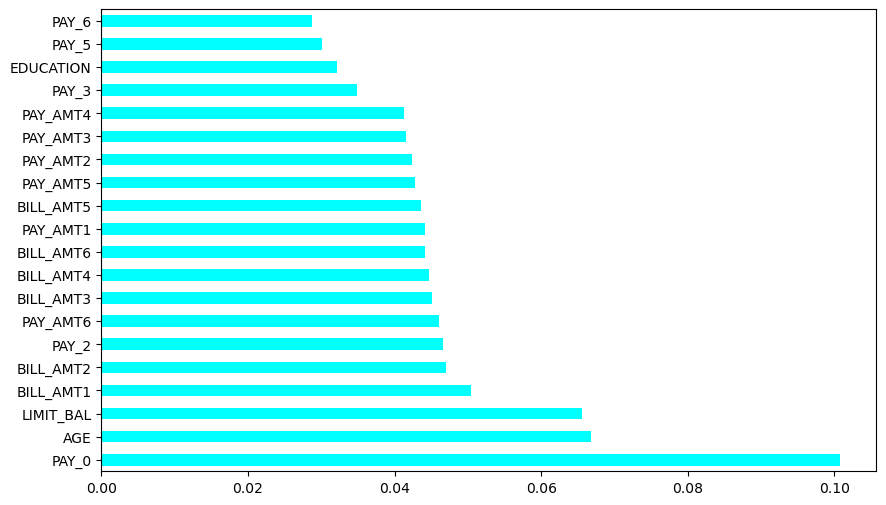

In [30]:
feature = pd.Series(extr.feature_importances_,index=x.columns)
plt.figure(figsize=(10,6))
feature.nlargest(20).plot(kind='barh',color='cyan')
plt.savefig('./image/score2.png')

In [31]:
# x=newx
x.corr()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
LIMIT_BAL,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,-0.249411,...,0.283236,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595
SEX,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,-0.055064,...,-0.024563,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766
EDUCATION,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,0.097520,...,0.013002,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200
MARRIAGE,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,0.035629,...,-0.024909,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641
AGE,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,-0.053826,...,0.053710,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478
PAY_0,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,0.509426,...,0.179785,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673
PAY_2,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,0.622780,...,0.224146,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500
PAY_3,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,0.686775,...,0.227494,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861
PAY_4,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,0.819835,...,0.244983,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565
PAY_5,-0.249411,-0.055064,0.097520,0.035629,-0.053826,0.509426,0.622780,0.686775,0.819835,1.000000,...,0.243335,0.271915,0.269783,0.262509,-0.006089,-0.003191,0.009062,-0.058299,-0.033337,-0.023027


In [32]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

<AxesSubplot:>

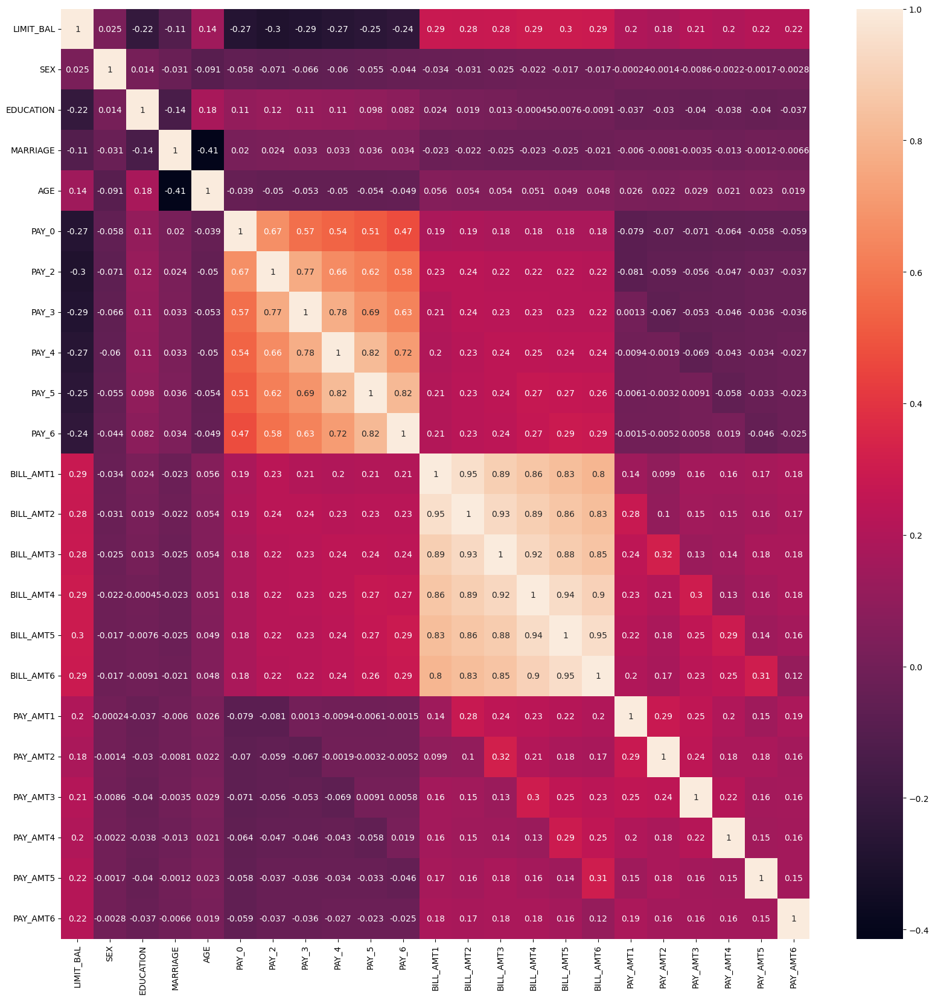

In [33]:
feature_name=x.columns #feature name
colname = x.corr().index #feature name
plt.figure(figsize=(20,20))
sns.heatmap(df[colname].corr(),annot=True)

## Select K Best

In [34]:
df = pd.read_csv('./DataSet/credit card.csv')
df = df.rename(columns={'default.payment.next.month':'payment'})

x =  df.drop(['ID','payment'],axis=1)
y = df['payment']

In [35]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [36]:
y.head()

0    1
1    1
2    0
3    0
4    0
Name: payment, dtype: int64

In [37]:
from sklearn.feature_selection import SelectKBest,f_classif,chi2,f_regression #chi-squared stats between each non-negative feature and class.

In [38]:
model2=SelectKBest(score_func=f_classif)

In [39]:
feature_score = model2.fit(x,y)

In [40]:
feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [41]:
cols = pd.DataFrame(feature_score.scores_,columns=['Feature_Scores'])
cols

,Feature_Scores
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556
5,3537.714970
6,2239.169136
7,1757.466444
8,1476.845967
9,1304.591176


In [42]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [43]:
col2 = pd.DataFrame(x.columns,columns=['Feature_Name'])
col2

,Feature_Name
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [44]:
scores = pd.concat([col2,cols],axis=1)
scores

,Feature_Name,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [45]:
newx = scores.nlargest(15,'Feature_Scores')
newx

,Feature_Name,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


<AxesSubplot:>

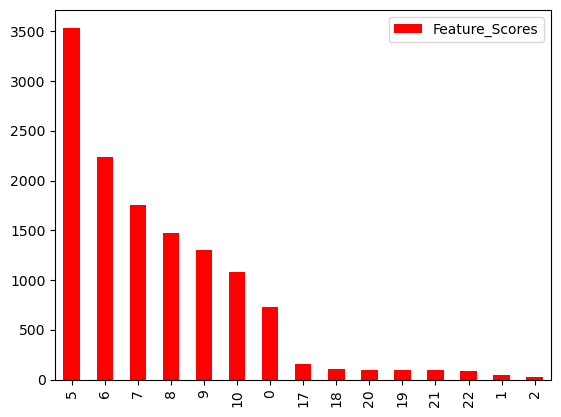

In [46]:
newx.plot(kind='bar',color=['red']) #barh mean horizontal

<AxesSubplot:>

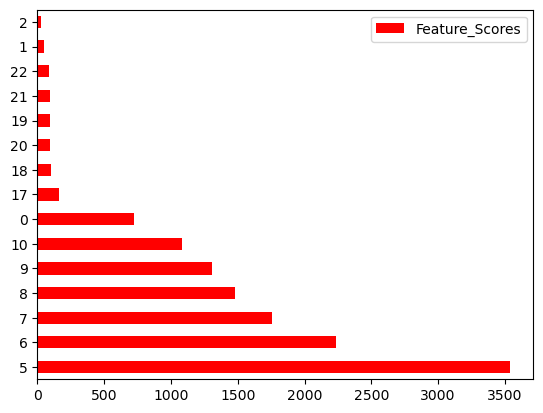

In [47]:
newx.plot(kind='barh',color=['red']) #barh mean horizontal

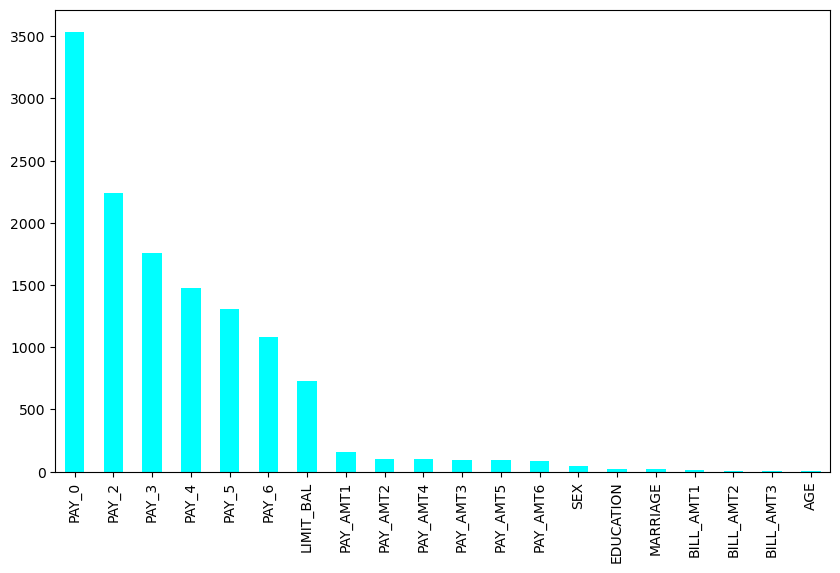

In [48]:
feature = pd.Series(feature_score.scores_,index=x.columns)
plt.figure(figsize=(10,6))
feature.nlargest(20).plot(kind='bar',color='cyan')
plt.savefig('./image/score2.png')

In [49]:
x.corr()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
LIMIT_BAL,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,-0.249411,...,0.283236,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595
SEX,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,-0.055064,...,-0.024563,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766
EDUCATION,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,0.097520,...,0.013002,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200
MARRIAGE,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,0.035629,...,-0.024909,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641
AGE,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,-0.053826,...,0.053710,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478
PAY_0,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,0.509426,...,0.179785,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673
PAY_2,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,0.622780,...,0.224146,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500
PAY_3,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,0.686775,...,0.227494,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861
PAY_4,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,0.819835,...,0.244983,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565
PAY_5,-0.249411,-0.055064,0.097520,0.035629,-0.053826,0.509426,0.622780,0.686775,0.819835,1.000000,...,0.243335,0.271915,0.269783,0.262509,-0.006089,-0.003191,0.009062,-0.058299,-0.033337,-0.023027


<AxesSubplot:>

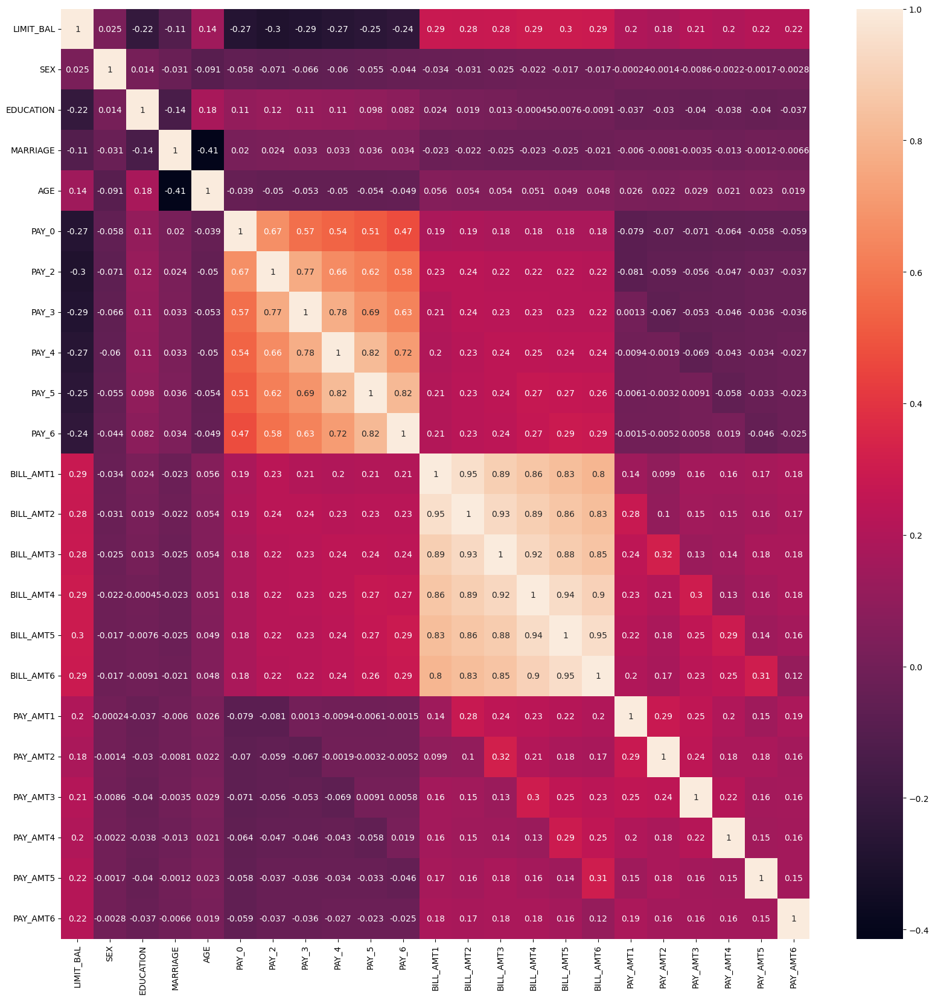

In [50]:
feature_name=x.columns #feature name
colname = x.corr().index #feature name
plt.figure(figsize=(20,20))
sns.heatmap(df[colname].corr(),annot=True)

## Principal Component Analysis (PCA)

In [51]:
import pandas as pd

df = pd.read_csv('./DataSet/credit card.csv')
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [52]:
df = df.rename(columns={'default.payment.next.month':'payment'})
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [53]:
x = df.drop(['ID','payment'],axis=1)
y = df['payment']

In [54]:
#feature scaling
from sklearn.preprocessing import MinMaxScaler #StandardScaler()

In [55]:
mmx = MinMaxScaler() #feature range = (2,3)

In [56]:
scaled_x = mmx.fit_transform(x)

In [57]:
scaled_x.shape

(30000, 23)

In [58]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

In [59]:
from sklearn.decomposition import PCA

In [60]:
pca = PCA(n_components=3)
x_pa = pca.fit_transform(scaled_x)
x_pa

array([[-0.40423245, -0.00800476, -0.00259672],
       [-0.39188881,  0.209224  , -0.19698759],
       [-0.39264215,  0.08409527, -0.12656657],
       ...,
       [ 0.62351265,  0.33728837, -0.08489179],
       [ 0.60374479, -0.01953155,  0.21421101],
       [ 0.60917214,  0.0099741 ,  0.23321988]])

In [61]:
feature = pd.DataFrame(x_pa,columns=['pca1','pca2','pca3'])
feature

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231678
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


In [62]:
import plotly.express as pl
pl.scatter_3d(feature,x='pca1',y='pca2',z='pca3',color='pca1')

In [63]:
from sklearn.model_selection import train_test_split

In [64]:
xtrain,xtest,ytrain,ytest = train_test_split(feature,y,test_size=.30)

In [65]:
xtrain

,pca1,pca2,pca3
27205,0.617799,0.162242,0.302096
17569,-0.388185,0.166602,-0.111473
25547,-0.391989,0.045900,-0.034069
14518,0.607884,0.017676,0.213116
9412,0.581881,-0.293321,-0.271539
...,...,...,...
12817,0.598872,-0.189289,0.209689
6623,-0.388024,0.303364,-0.219279
413,-0.391647,0.176458,-0.173240
6580,0.601753,0.053374,-0.277079


In [66]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()
clf.fit(xtrain,ytrain)
clf.score(xtest,ytest)*100

70.75555555555556

In [67]:
clf.score(xtrain,ytrain)*100

99.94285714285715

In [68]:
clf.predict(xtest)

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [69]:
y.value_counts()

0    23364
1     6636
Name: payment, dtype: int64

## Before

In [70]:
xtrain1,xtest1,ytrain1,ytest1 = train_test_split(x,y,test_size=.30,random_state=1)
clf.fit(xtrain1,ytrain1)
clf.score(xtest1,ytest1)*100

71.82222222222222

In [71]:
clf.score(xtrain1,ytrain1)*100

99.93333333333332